# import

In [1]:
import numpy as np, cv2
import matplotlib.pylab as plt
import os
import cv2
from PIL import Image




# image data

In [4]:

from PIL import Image
# 집
# nor_folder_path = r"C:\\Users\\31083\\jojojojo\\Project2\\CNC_YOLOV8_Segmodel\\이미지_파일\\7월14일_정상"

#연구실
nor_folder_path = nor_folder_path = r"C:\Users\31083\Documents\GitHub\Project\CNC_YOLOV8_Segmodel\Image\7월25일_발표용"

nor_image_files = os.listdir(nor_folder_path)

nor_images = []
for file_name in nor_image_files:
    file_path = os.path.join(nor_folder_path, file_name)
    image = Image.open(file_path)
    # PIL 이미지를 OpenCV 형식으로 변환 (선택 사항)
    image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    nor_images.append(image)

In [ ]:


save_path = r"C:\Users\31083\Documents\GitHub\Project\CNC_YOLOV8_Segmodel\Image\7월25일_발표용\.png"

# 이미지 저장
cv2.imwrite(save_path, image)


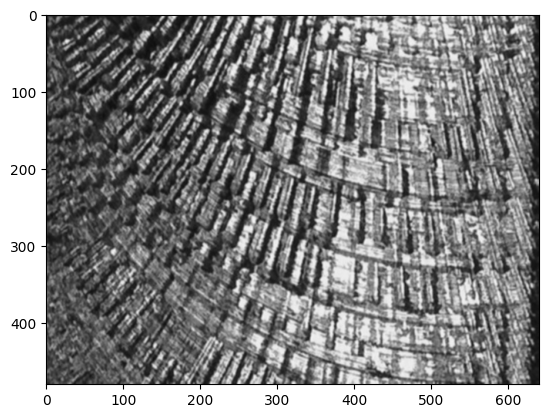

In [8]:
plt.imshow(nor_images[2])

In [9]:
wear_1 = nor_images[1]

wear_2 = nor_images[2]

nor = nor_images[0]

# Operator

In [10]:
import numpy as np

# 2차원 필터 정의
roberts_1 = np.array([[1, 0],
                     [0, -1]])

roberts_2 = np.array([[0, 1],
                     [-1, 0]])

sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])

prewitt_x = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]])

prewitt_y = np.array([[1, 1, 1],
                      [0, 0, 0],
                      [-1, -1, -1]])

LoG_3_1 = np.array([[0, -1, 0],
                    [-1, 4, -1],
                    [0, -1, 0]])

LoG_3_2 = np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])

LoG_5 = np.array([[0, 0, -1, 0, 0],
                  [0, -1, -2, -1, 0],
                  [-1, -2, 16, -2, -1],
                  [0, -1, -2, -1, 0],
                  [0, 0, -1, 0, 0]])

LoG_9 = np.array([[0, 1, 1, 2, 2, 2, 1, 1, 0],
                  [1, 2, 4, 5, 5, 5, 4, 2, 1],
                  [1, 4, 5, 3, 0, 3, 5, 4, 1],
                  [2, 5, 3, -12, -24, -12, 3, 5, 2],
                  [2, 5, 0, -24, -40, -24, 0, 5, 2],
                  [2, 5, 3, -12, -24, -12, 3, 5, 2],
                  [1, 4, 5, 3, 0, 3, 5, 4, 1],
                  [1, 2, 4, 5, 5, 5, 4, 2, 1],
                  [0, 1, 1, 2, 2, 2, 1, 1, 0]])

# 2차원 필터를 3차원으로 변경
roberts_1_3d = np.expand_dims(roberts_1, axis=2)
roberts_2_3d = np.expand_dims(roberts_2, axis=2)

sobel_x_3d = np.expand_dims(sobel_x, axis=2)
sobel_y_3d = np.expand_dims(sobel_y, axis=2)

prewitt_x_3d = np.expand_dims(prewitt_x, axis=2)
prewitt_y_3d = np.expand_dims(prewitt_y, axis=2)

LoG_3_1_3d = np.expand_dims(LoG_3_1, axis=2)
LoG_3_2_3d = np.expand_dims(LoG_3_2, axis=2)

LoG_5_3d = np.expand_dims(LoG_5, axis=2)
LoG_9_3d = np.expand_dims(LoG_9, axis=2)



# def

In [11]:
def show(img, result1, result2, result, thr_result):
    
    plt.imshow(img, cmap='gray')
    plt.show()
    
    plt.imshow(result1, cmap='gray')
    plt.show()
    
    plt.imshow(result2, cmap='gray')
    plt.show()
    
    plt.imshow(result, cmap='gray')
    plt.show()
    
    plt.imshow(thr_result, cmap='gray')
    plt.show()

def edge_detection(img, mask1, mask2, threshold, show_img=True):
    
    img_shape = img.shape
    
    try:
        if mask1.shape != mask2.shape:
            raise Exception('마스크의 크기가 서로 다릅니다.')
        filter_size = mask1.shape
    except Exception as e:
        print('예외가 발생했습니다.', e)

    result_shape = tuple(np.array(img_shape)-np.array(filter_size)+1)

    result1 = np.zeros(result_shape)
    result2 = np.zeros(result_shape)

    for h in range(0, result_shape[0]):
        for w in range(0, result_shape[1]):
            tmp = img[h:h+filter_size[0],w:w+filter_size[1]]
            result1[h,w] = np.abs(np.sum(tmp*mask1))
            result2[h,w] = np.abs(np.sum(tmp*mask2))
            
    result = result1 + result2
    
    thr_result = np.zeros(result_shape)
    thr_result[result>threshold] = 1
    
    if show_img:
        show(img, result1, result2, result, thr_result)
    
    return result1, result2, result, thr_result

## robert operator

### `-` wear

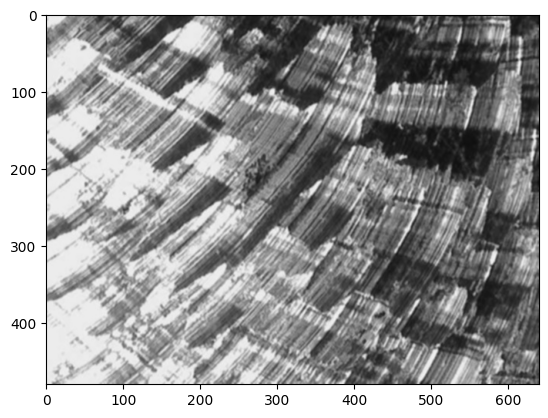

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


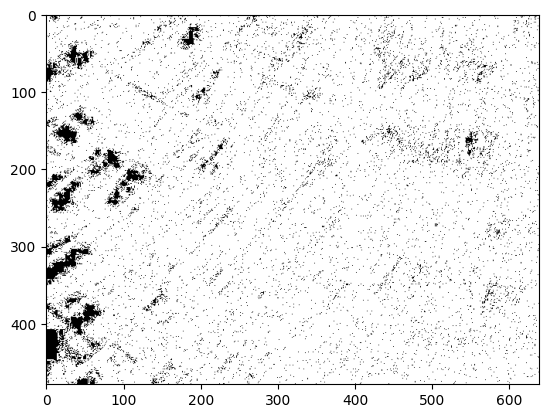

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


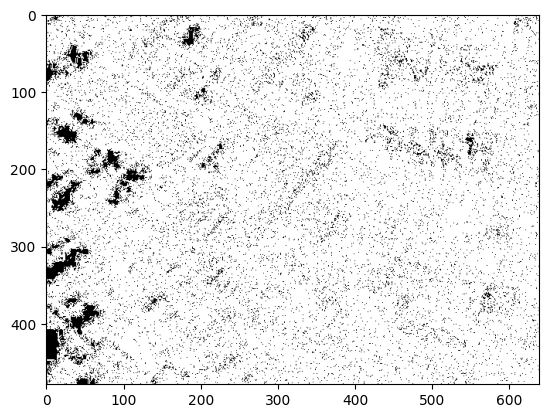

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


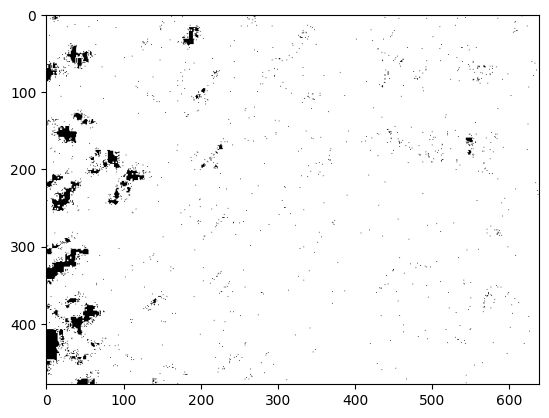

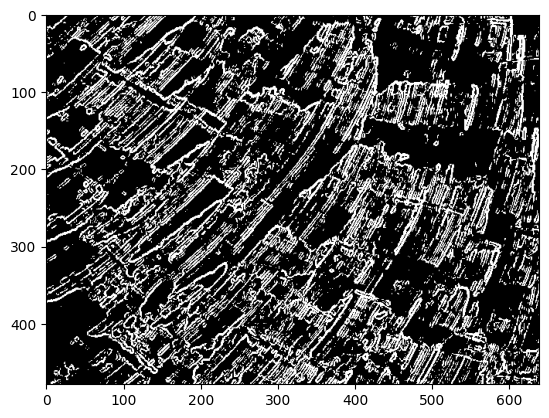

In [48]:
a,b,c,wear_robert_1 = edge_detection(wear_1, roberts_1_3d, roberts_2_3d, threshold=100,show_img=True)


In [57]:

save_path = r"C:\Users\31083\Documents\GitHub\Project\CNC_YOLOV8_Segmodel\Image\7월25일_발표용_결과\wear_robert_1.jpg"

# 이미지 저장
cv2.imwrite(save_path,wear_robert_1)

False

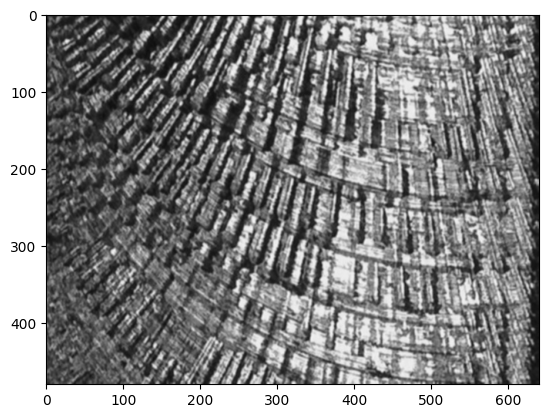

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


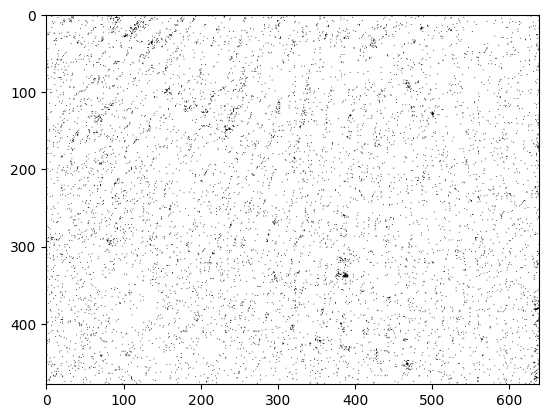

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


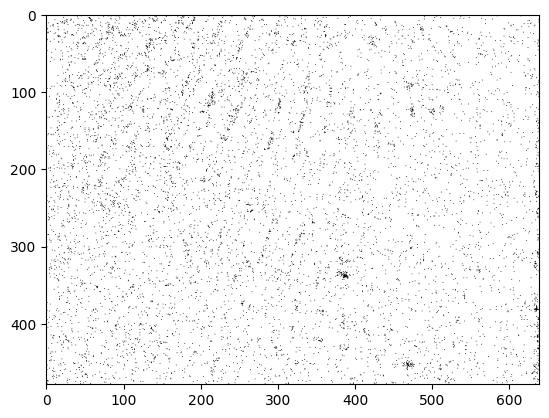

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


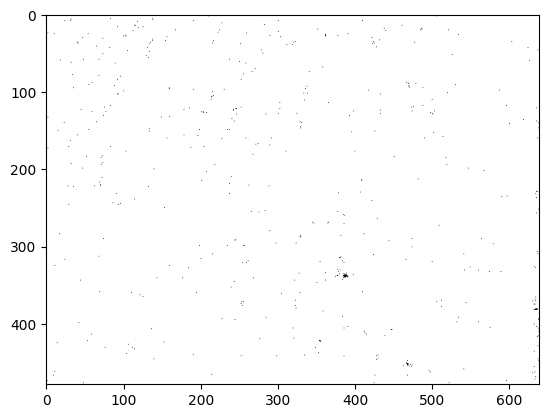

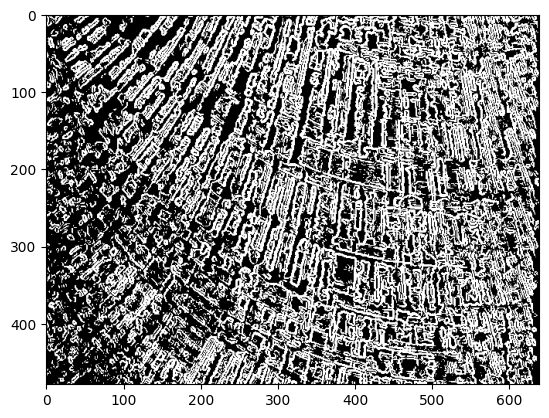

In [30]:

a,b,c,wear_robert_2 = edge_detection(wear_2, roberts_1_3d, roberts_2_3d, threshold=100,show_img=True)




### `-` normal

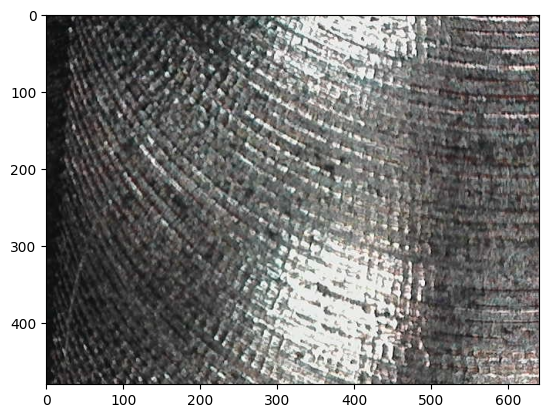

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


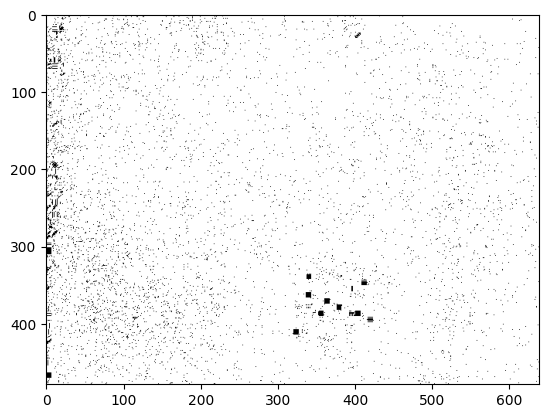

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


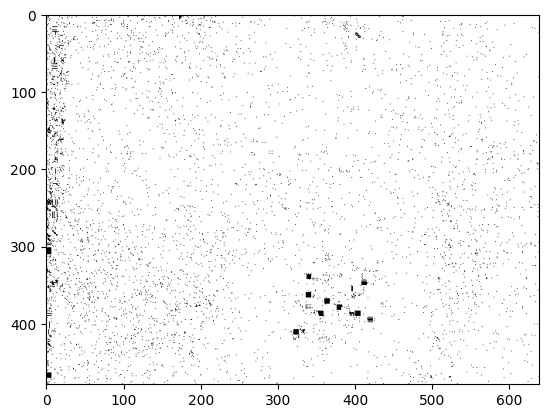

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


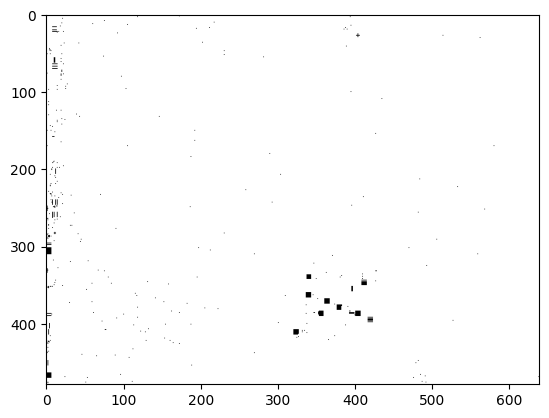

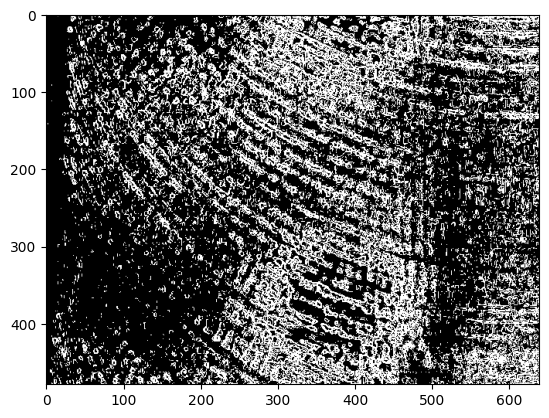

In [49]:
a,b,c,nor_robert = edge_detection(nor, roberts_1_3d, roberts_2_3d, threshold=120,show_img=True)



In [ ]:
plt.i

## sobel operator

### `-` wear

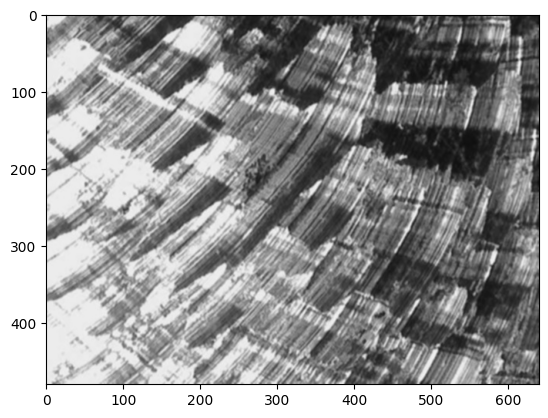

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


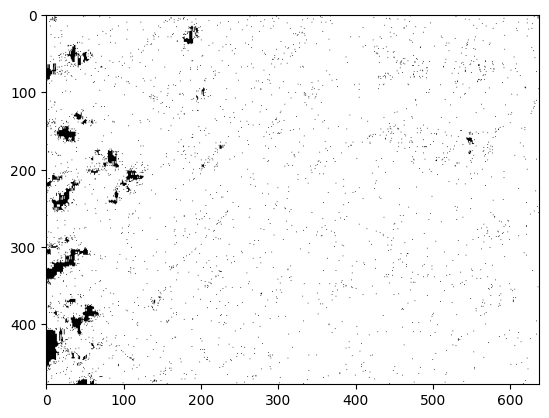

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


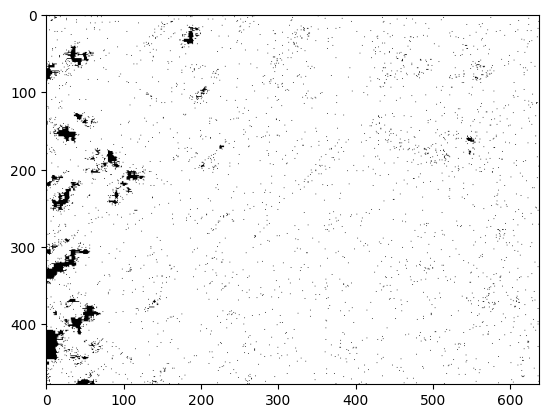

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


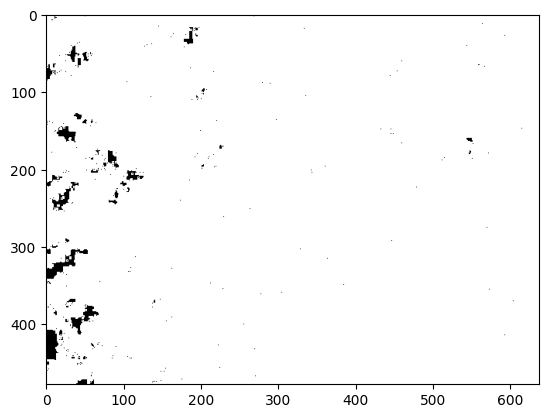

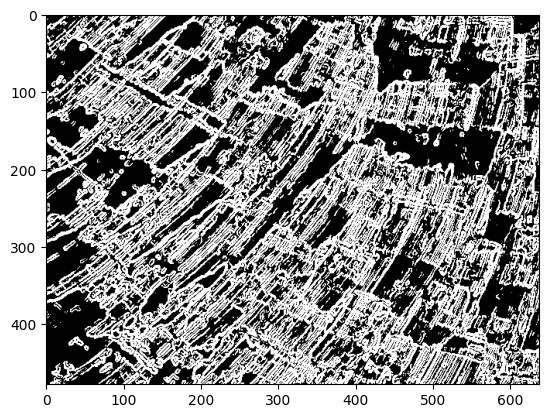

In [15]:
a,b,c,wear_sobel_1 = edge_detection(wear_1, sobel_x_3d, sobel_y_3d, threshold=300,show_img=True)


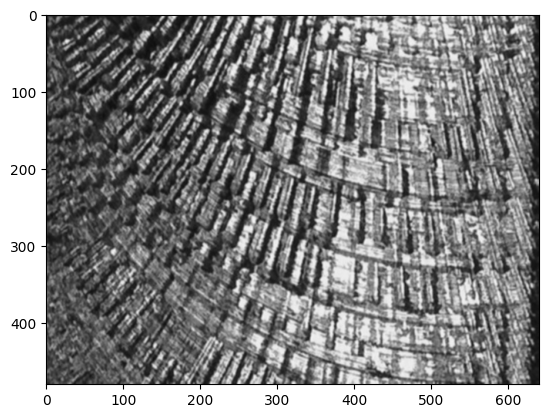

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


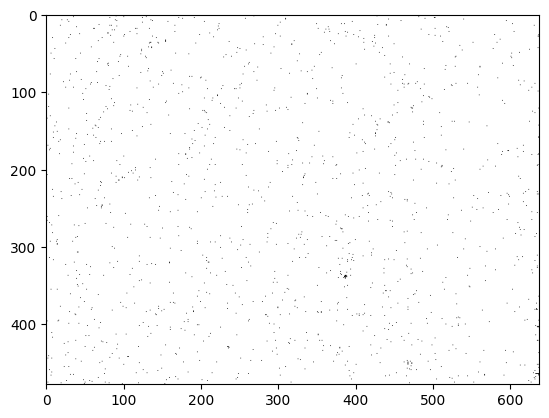

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


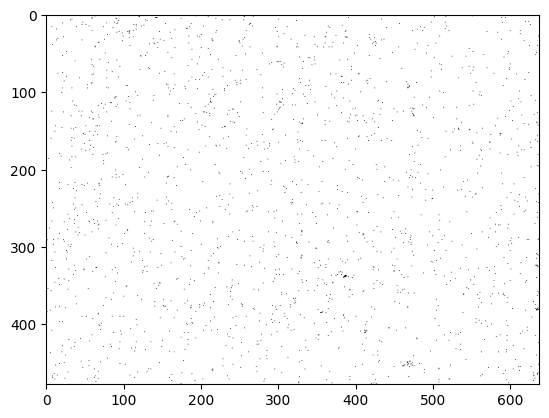

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


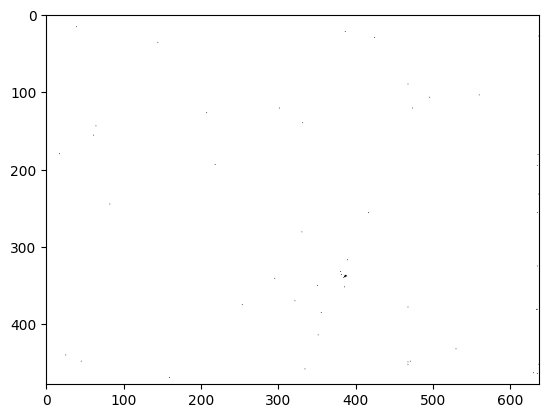

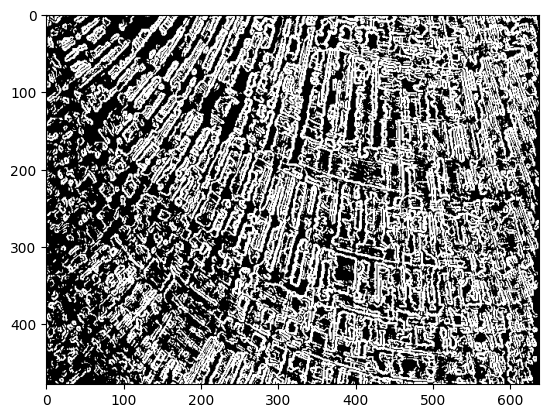

In [16]:

a,b,c,wear_sobel_2 = edge_detection(wear_2, sobel_x_3d, sobel_y_3d, threshold=500,show_img=True)


### `-`normal

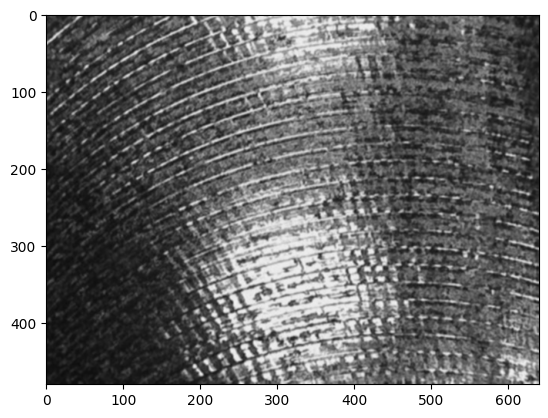

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


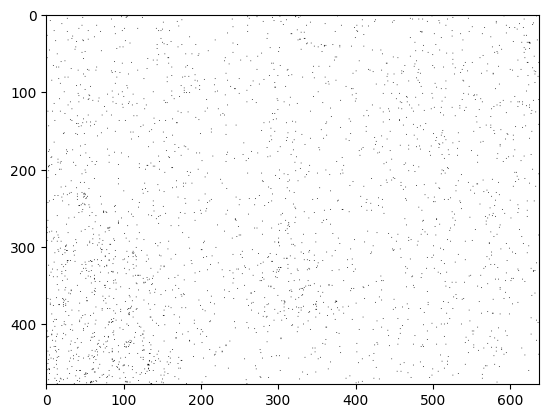

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


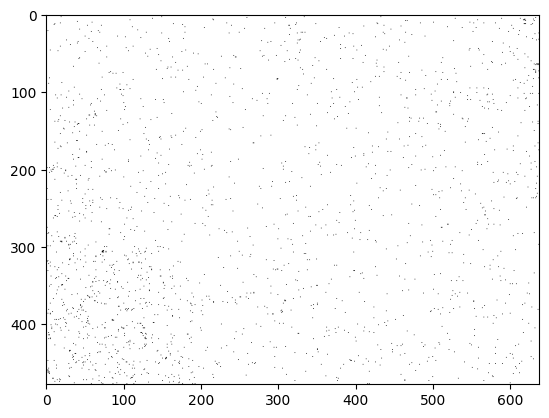

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


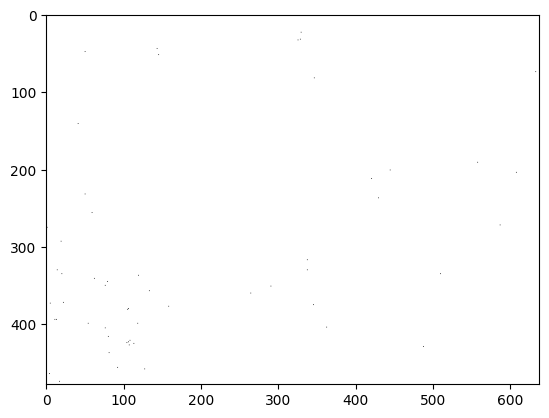

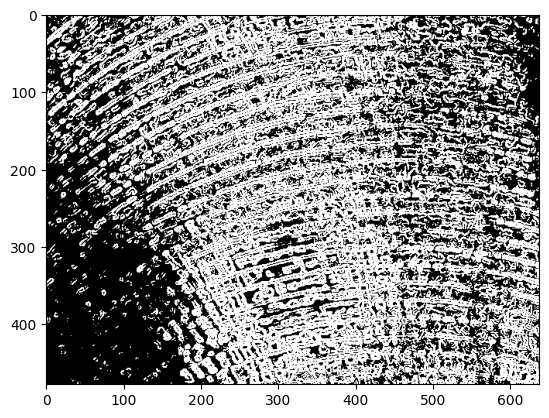

In [17]:
a,b,c,nor_sobel = edge_detection(nor, sobel_x_3d, sobel_y_3d, threshold=300,show_img=True)


## prewitt operator 

### `-` wear

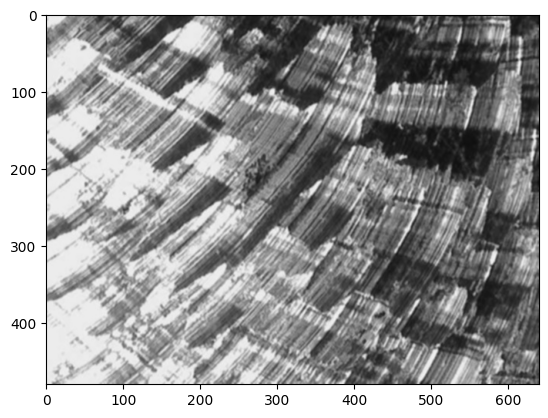

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


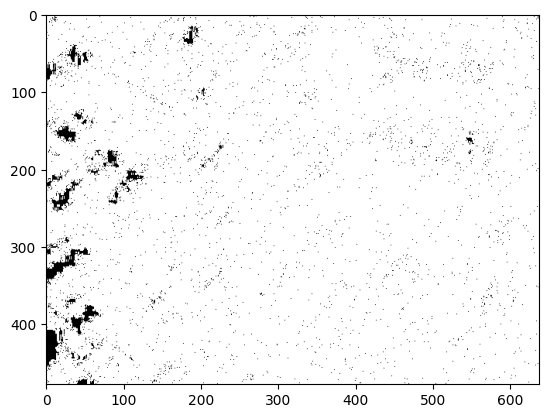

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


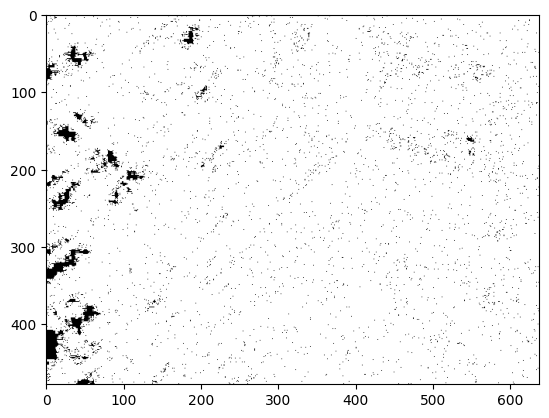

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


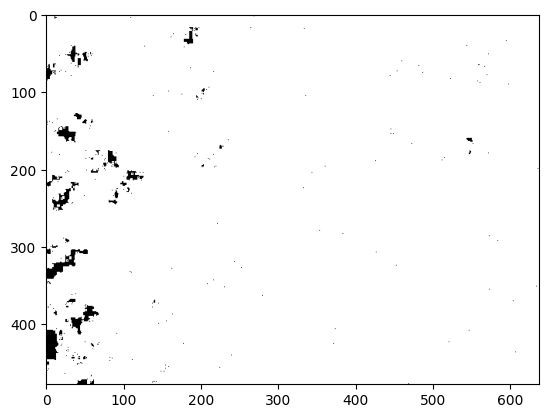

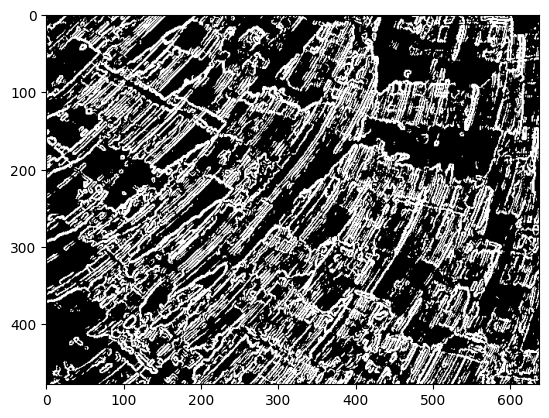

In [18]:
a,b,c,wear_prewitt_1 = edge_detection(wear_1, prewitt_x_3d, prewitt_y_3d, threshold=300,show_img=True)


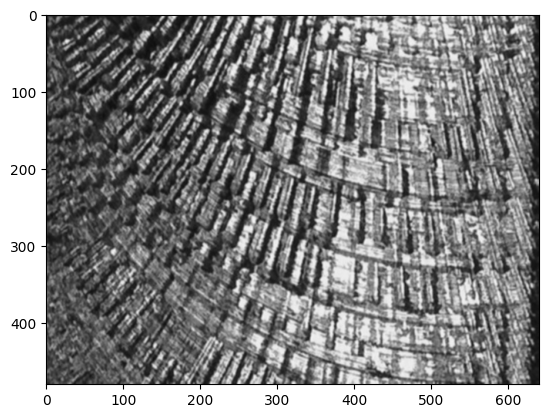

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


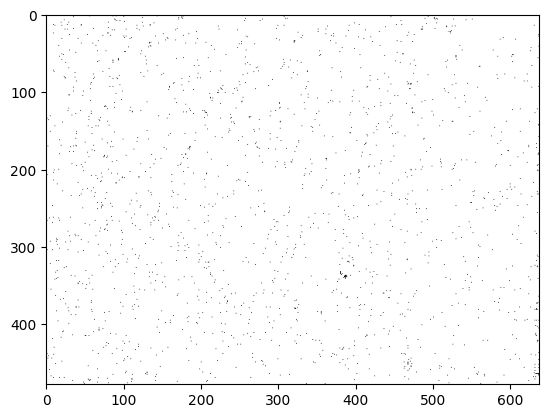

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


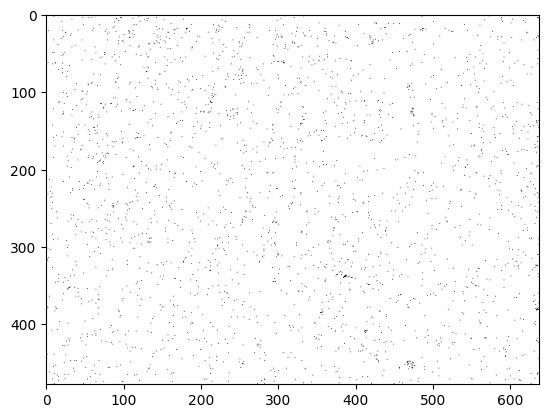

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


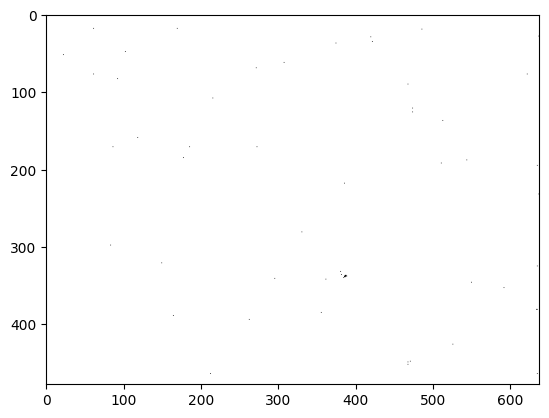

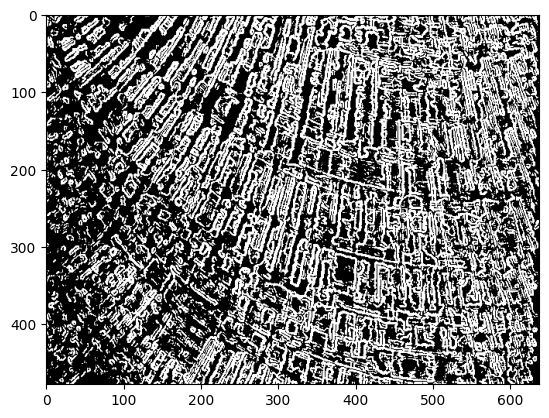

In [19]:
a,b,c,wear_prewitt_2 = edge_detection(wear_2,prewitt_x_3d, prewitt_y_3d, threshold=400,show_img=True)


### `-`normal 

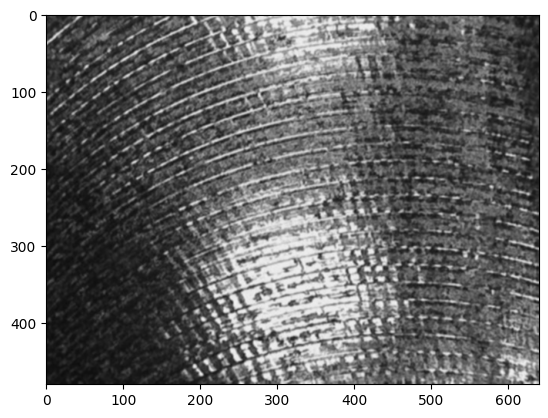

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


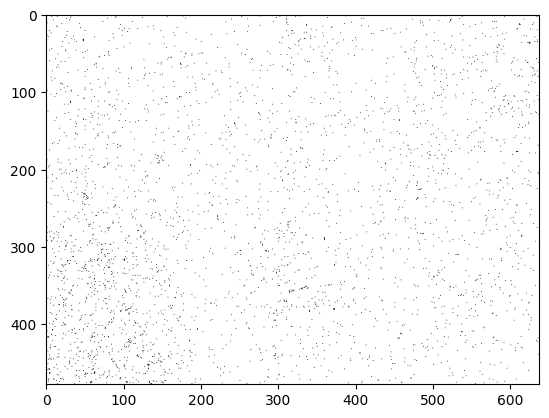

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


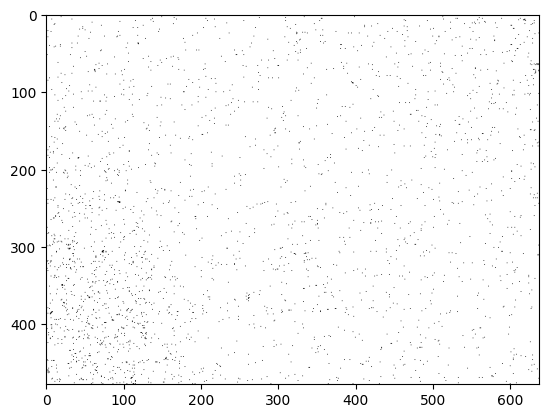

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


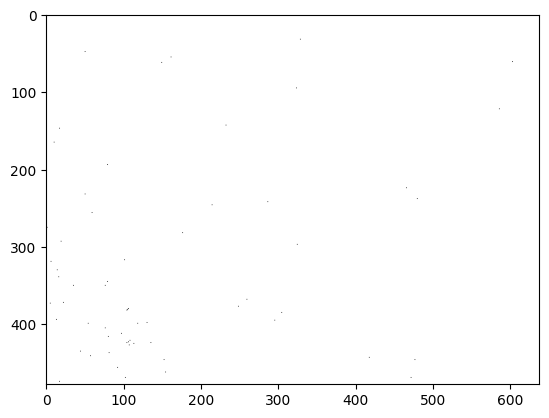

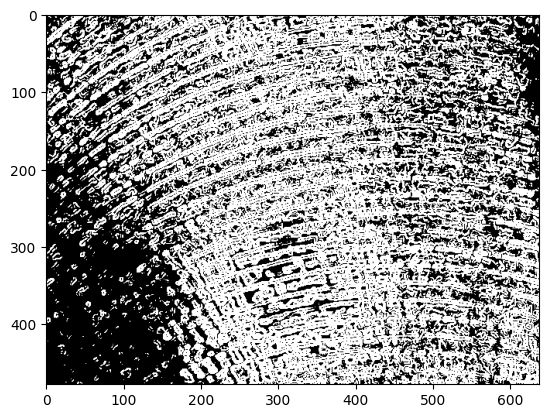

In [20]:
a,b,c,nor_prewitt = edge_detection(nor, prewitt_x_3d, prewitt_y_3d, threshold=200,show_img=True)


## log_3 operator 

### `-` wear

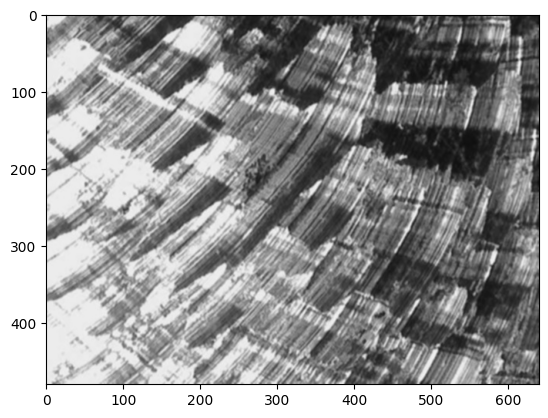

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


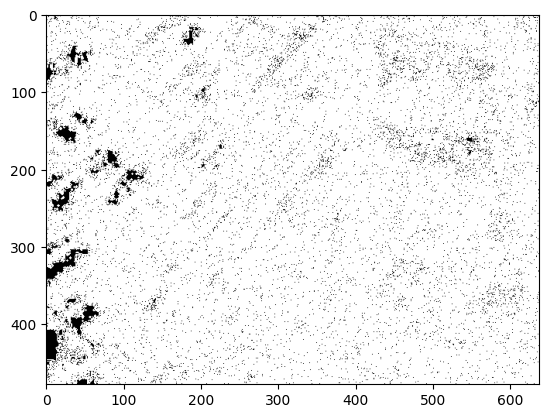

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


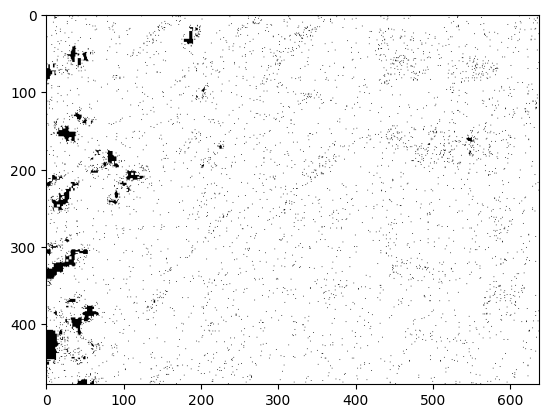

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


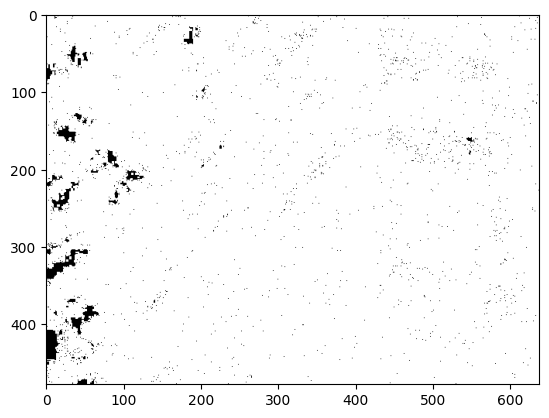

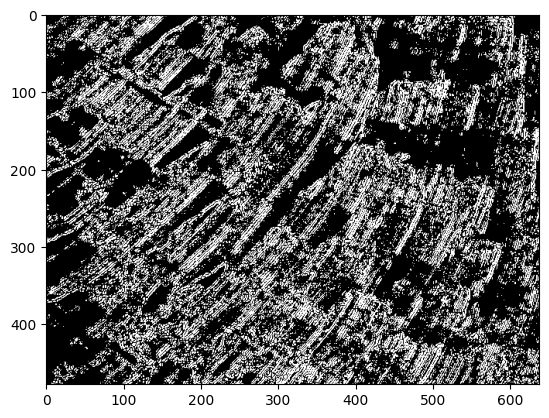

In [34]:
a,b,c,wear_log3_1 = edge_detection(wear_1,LoG_3_1_3d, LoG_3_2_3d, threshold=180,show_img=True)


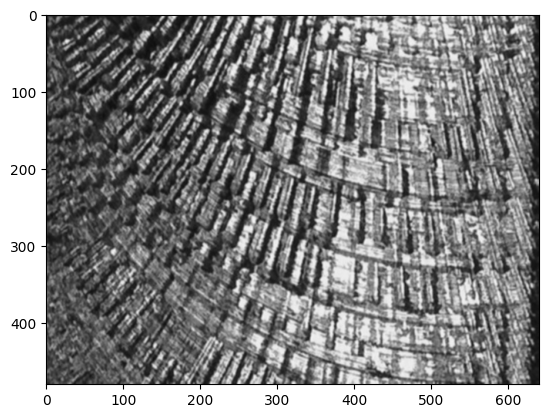

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


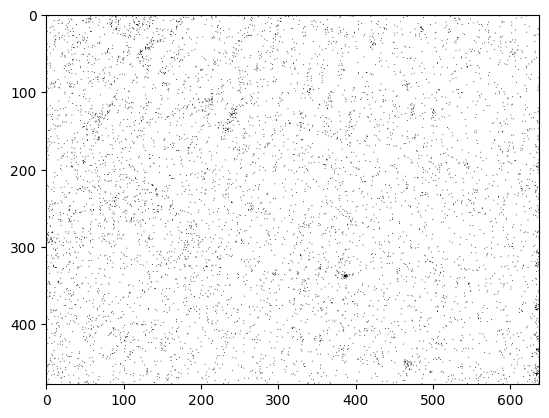

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


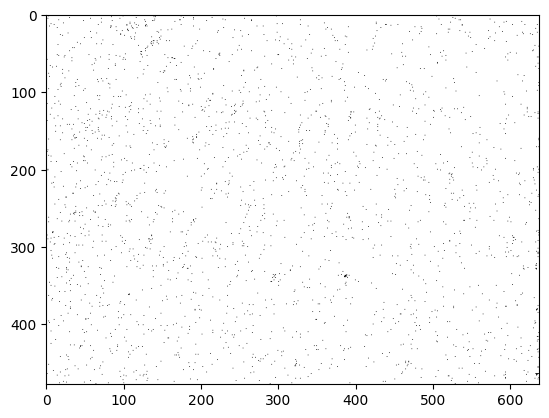

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


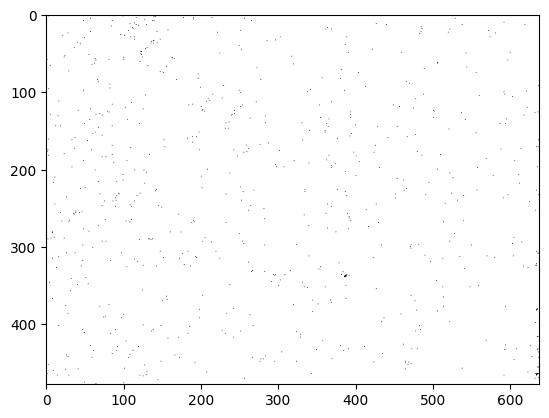

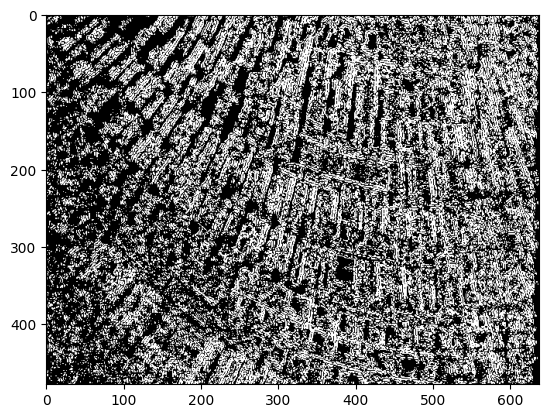

In [38]:
a,b,c,wear_log3_2 = edge_detection(wear_2,LoG_3_1_3d, LoG_3_2_3d, threshold=220,show_img=True)


### `-`normal 

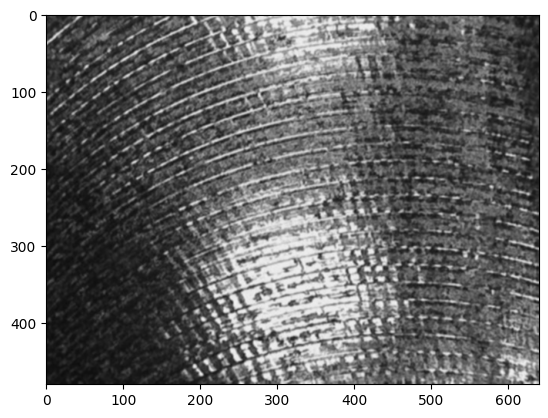

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


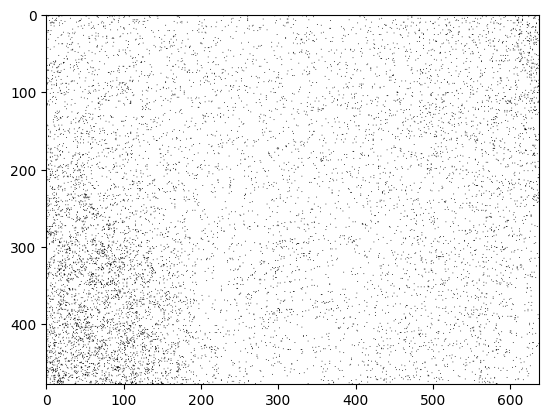

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


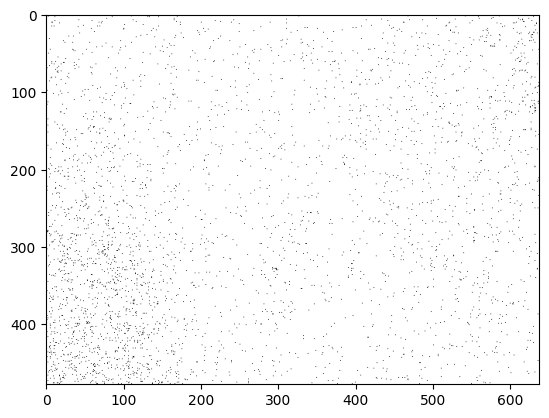

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


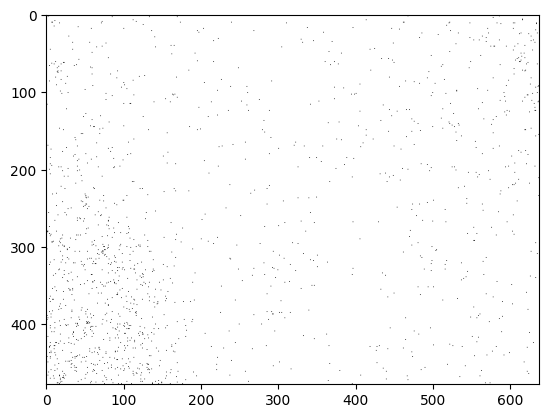

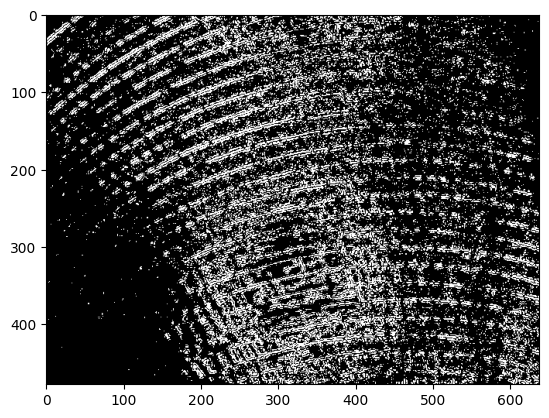

In [39]:
a,b,c,nor_log3 = edge_detection(nor,LoG_3_1_3d, LoG_3_2_3d, threshold=250,show_img=True)


## log_5 operator 

### `-` wear

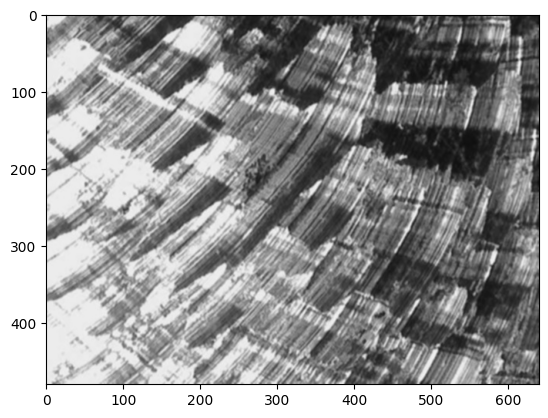

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


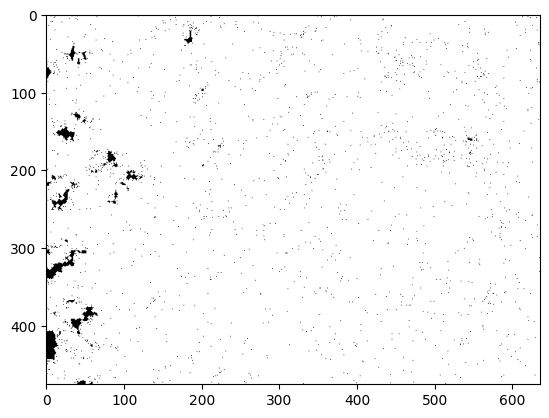

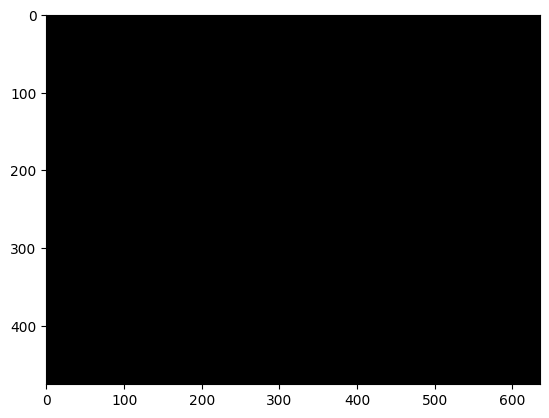

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


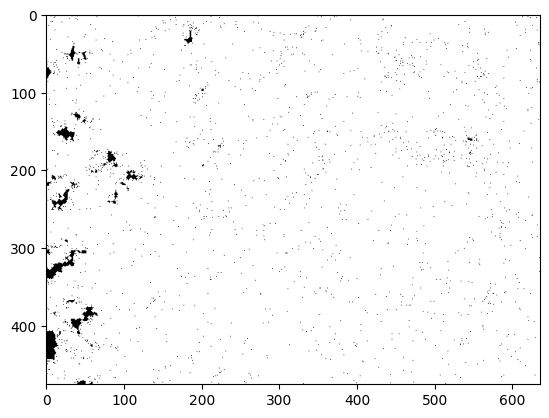

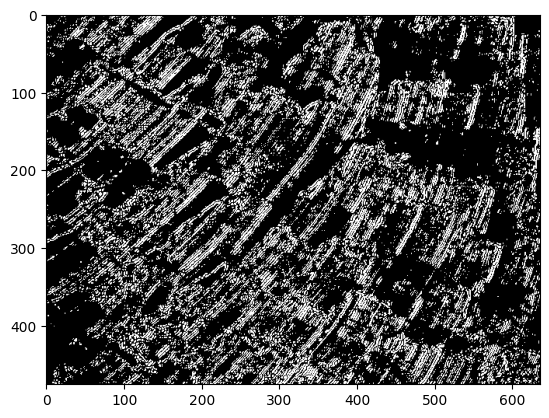

In [24]:
a,b,c,wear_log5_1 = edge_detection(wear_1,LoG_5_3d, np.zeros_like(LoG_5_3d), threshold=400,show_img=True)


In [25]:
LoG_5_3d

array([[[ 0],
        [ 0],
        [-1],
        [ 0],
        [ 0]],

       [[ 0],
        [-1],
        [-2],
        [-1],
        [ 0]],

       [[-1],
        [-2],
        [16],
        [-2],
        [-1]],

       [[ 0],
        [-1],
        [-2],
        [-1],
        [ 0]],

       [[ 0],
        [ 0],
        [-1],
        [ 0],
        [ 0]]])

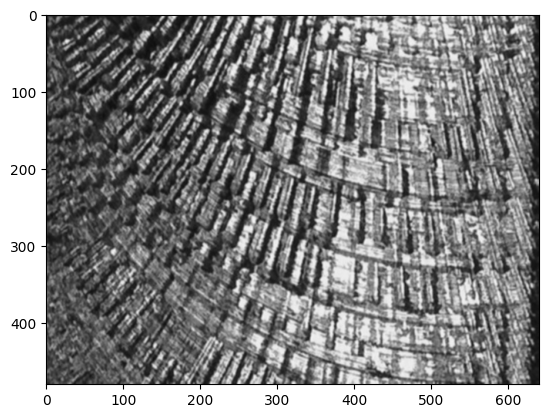

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


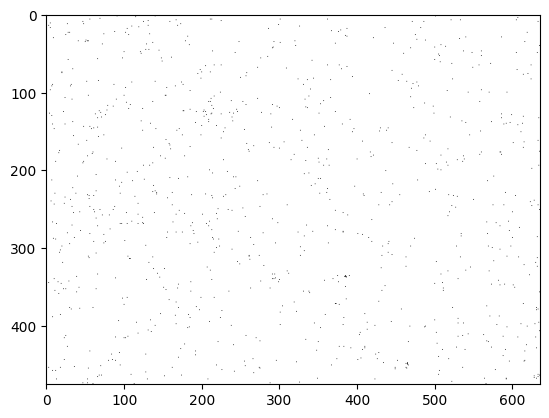

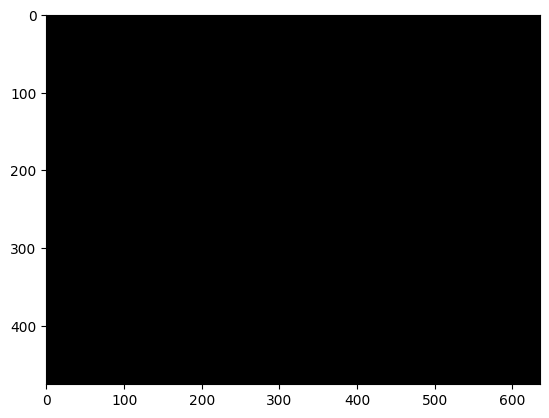

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


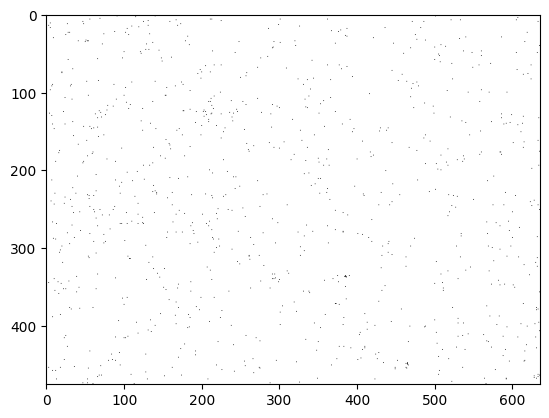

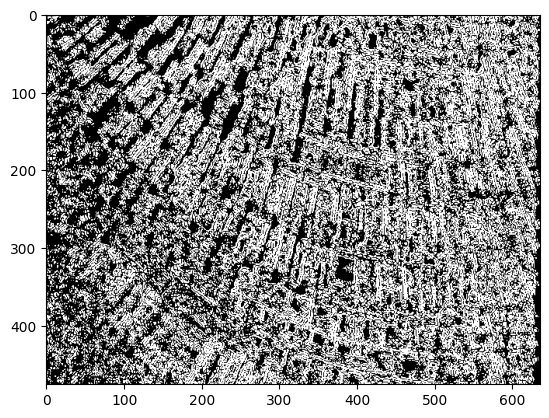

In [26]:
a,b,c,wear_log5_2 = edge_detection(wear_2,LoG_5_3d, np.zeros_like(LoG_5_3d), threshold=300,show_img=True)


### `-`normal 

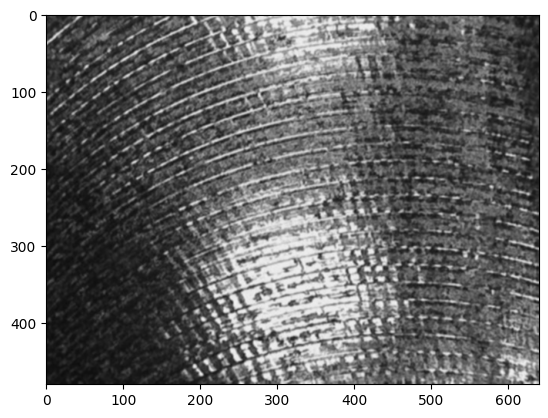

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


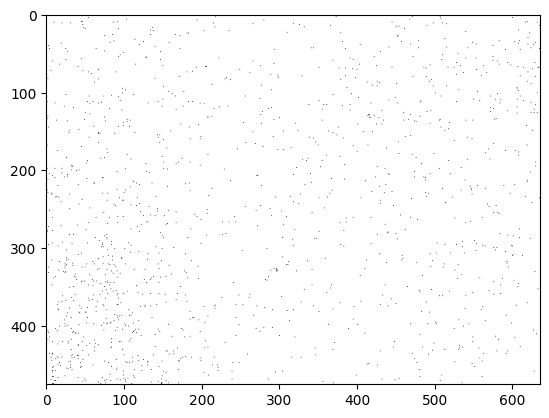

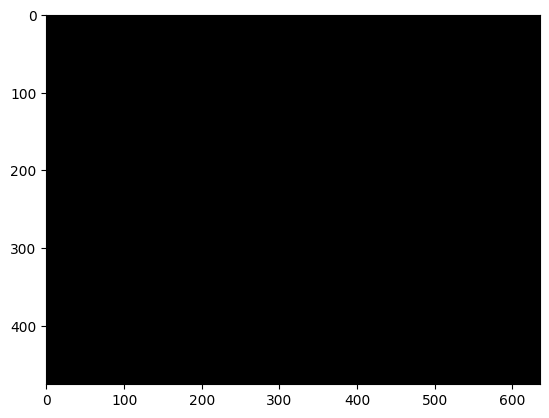

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


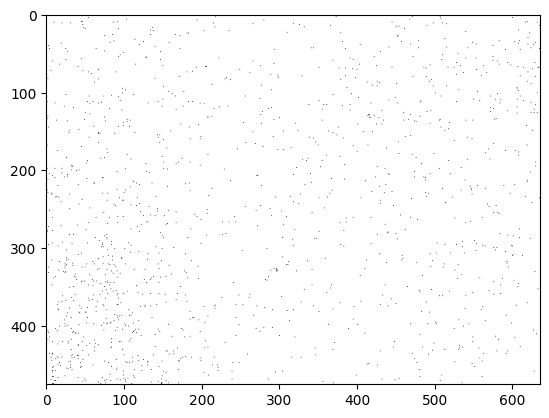

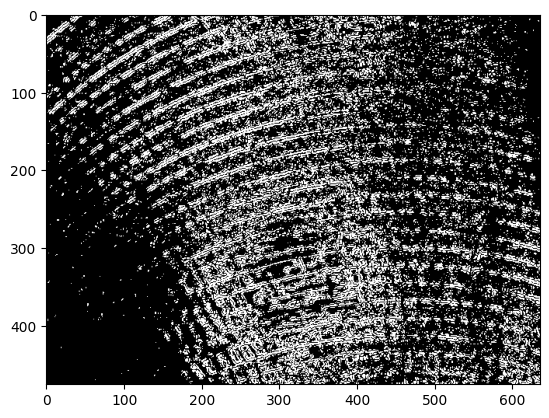

In [41]:
a,b,c,nor_log5 = edge_detection(nor,LoG_5_3d, np.zeros_like(LoG_5_3d), threshold=400,show_img=True)
